# Capstone Project - Classification of Accident Severity (Week 2)¶
### Applied Data Science Capstone by IBM/Coursera

### Table of contents
* Introduction: Business Problem
* Data
* Methodology
* Results and Discussion
* Conclusion

# Introduction : Business Problem

Accident in traffic is an area of primary concern to society because it leads to loss of property and even loss of lives. It is therefore important to identify the key factors of accident severity, to avoid and prevent such loss and to improve safety. This is a classification problem. A model to predict accident severity is built using these predictors as input vectors. Once the model is validated using a Machine Learning algorithm approach, we can be confident in predicting accident severity. In this proactive approach, the results of the analysis would be useful to various Entities like the Police and Insurance Companies. The goal is to reduce the fatalities and economic losses from accidents.   

# Data

The data used in this analysis is a collection of traffic records from the Seattle Department of Transportation (SDOT) Traffic Management Division. It consists of 194,673 observations and 38 variables. The variable SEVERITY CODE is the dependent variable to be predicted. It has 2 values: 1- Property Damage; 2- Injury. We would like to identify the variables (among the 37 left ) that increase the severity of accident fatality. Some variables are numerical, and some are categorical. Among others, the followings are potential variables of interest: Location, Weather condition, Car Speeding, Light condition, Road condition, Junction type, Number of people involved, and Number of vehicles involved in the accident.

# Methodology

This project intends to provide a method to classify the outcome, accident severity into two categories: property damage and injuries. The following steps are performed.
<br>
* Identify the candidate variables for classifying the outcome. This will be done through Exploratory analyses (visual and tabular representation of the distribution of selected variables by class) and Data cleaning (replace inconceivable values, assess missing values)
* Balance data to avoid bias result with the Synthetic Minority Oversampling Technique (SMOTE) algorithm. 
* Perform three analyses on the balanced data
    1. Assuming the relationship is linear, a logit model is applied to identify statistically significant predictor. Dummy variables are constructed for Categorical variables. Using machine learning concept, a logistic regression is run on a training data set to build a model which fit is assessed with a test set. Logistic regression is considered a basic model to learn from data.
    2. Assuming the relationship is nonlinear, two decision tree-based approach is used: a single decision tree and an ensemble of decision tree (random forest). Both algorithms are appropriate for classification. Random forest is expected to perform better than a single decision tree.
    3. Performance metrics (Classification Accuracy, Area Under the Curve) on these 3 models are computed.


In [1]:
import numpy as np
import pandas as pd
from imblearn.over_sampling import SMOTE
from tensorflow.keras import backend

In [2]:
input_file = '/home/ytra/Data-Collisions.csv'
df = pd.read_csv(input_file,low_memory=False)
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

(194673, 38)

The outcome variable accident severity has 2 values: 
<br>
* (1) Property damage (replaced to 0)
* (2) Injuries (replaced to 1)


In [3]:
df['SEVERITYCODE'] = df['SEVERITYCODE'].replace({1: 0, 2: 1})
df.SEVERITYCODE.value_counts()

0    136485
1     58188
Name: SEVERITYCODE, dtype: int64

The frequency distribution shows that about 70% of the accidents are property damage and 30% are injuries 

In [4]:
s = df.SEVERITYCODE
counts = s.value_counts()
percent = s.value_counts(normalize=True)
percent100 = s.value_counts(normalize=True).mul(100).round(1).astype(str)+'%'
pd.DataFrame({'counts': counts,'per':percent,'per100':percent100})

,counts,per,per100
0,136485,0.701099,70.1%
1,58188,0.298901,29.9%


The next following cells show the diatribution of some variables that might predict the type of accident severity

In [5]:
df['COLLISIONTYPE'].value_counts()

Parked Car    47987
Angles        34674
Rear Ended    34090
Other         23703
Sideswipe     18609
Left Turn     13703
Pedestrian     6608
Cycles         5415
Right Turn     2956
Head On        2024
Name: COLLISIONTYPE, dtype: int64

In [6]:
df['WEATHER'].value_counts()

Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [7]:
df['ROADCOND'].value_counts()

Dry               124510
Wet                47474
Unknown            15078
Ice                 1209
Snow/Slush          1004
Other                132
Standing Water       115
Sand/Mud/Dirt         75
Oil                   64
Name: ROADCOND, dtype: int64

Some variables are dropped since they are not used for the analysis. The target variable accident severity is renamed as y.

In [8]:
data = df.drop(['SEVERITYCODE.1','OBJECTID','X','Y','INCKEY','COLDETKEY','INTKEY','EXCEPTRSNCODE','EXCEPTRSNDESC','SEVERITYDESC','REPORTNO',
                'STATUS','ADDRTYPE','LOCATION','SDOT_COLCODE','SDOT_COLDESC','SDOTCOLNUM','ST_COLCODE','ST_COLDESC','SEGLANEKEY','CROSSWALKKEY',
                'HITPARKEDCAR','INCDATE','INCDTTM'],axis=1)
data = data.rename(columns={"SEVERITYCODE": "y"})
data.head()

,y,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,JUNCTIONTYPE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING
0,1,Angles,2,0,0,2,At Intersection (intersection related),NaN,N,Overcast,Wet,Daylight,NaN,NaN
1,0,Sideswipe,2,0,0,2,Mid-Block (not related to intersection),NaN,0,Raining,Wet,Dark - Street Lights On,NaN,NaN
2,0,Parked Car,4,0,0,3,Mid-Block (not related to intersection),NaN,0,Overcast,Dry,Daylight,NaN,NaN
3,0,Other,3,0,0,3,Mid-Block (not related to intersection),NaN,N,Clear,Dry,Daylight,NaN,NaN
4,1,Angles,2,0,0,2,At Intersection (intersection related),NaN,0,Raining,Wet,Daylight,NaN,NaN


In [9]:
s = data.y
counts = s.value_counts()
percent = s.value_counts(normalize=True)
percent100 = s.value_counts(normalize=True).mul(100).round(1).astype(str)+'%'
pd.DataFrame({'counts': counts,'per':percent,'per100':percent100})

,counts,per,per100
0,136485,0.701099,70.1%
1,58188,0.298901,29.9%


We investigate which variable might have an effect on accident severity by creating cross-tabular frequency distribution and bar plot by the target variable.

In [10]:
pd.crosstab(data.WEATHER,data.y)

y,0,1
WEATHER,,
Blowing Sand/Dirt,41,15
Clear,75295,35840
Fog/Smog/Smoke,382,187
Other,716,116
Overcast,18969,8745
Partly Cloudy,2,3
Raining,21969,11176
Severe Crosswind,18,7
Sleet/Hail/Freezing Rain,85,28


Text(0, 0.5, 'Frequency of Accidents')

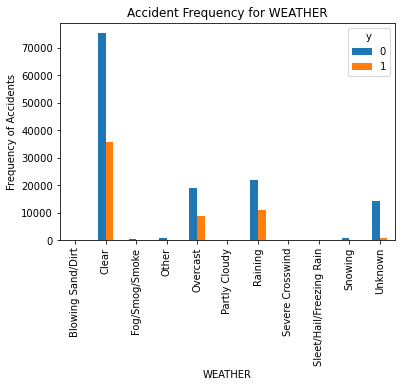

In [11]:
import matplotlib.pyplot as plt 
%matplotlib inline
pd.crosstab(data.WEATHER,data.y).plot(kind='bar')
plt.title('Accident Frequency for WEATHER')
plt.xlabel('WEATHER')
plt.ylabel('Frequency of Accidents')
#plt.savefig('purchase_fre_job')

In [12]:
pd.crosstab(data.ROADCOND,data.y)

y,0,1
ROADCOND,,
Dry,84446,40064
Ice,936,273
Oil,40,24
Other,89,43
Sand/Mud/Dirt,52,23
Snow/Slush,837,167
Standing Water,85,30
Unknown,14329,749
Wet,31719,15755


Text(0, 0.5, 'Frequency of Accidents')

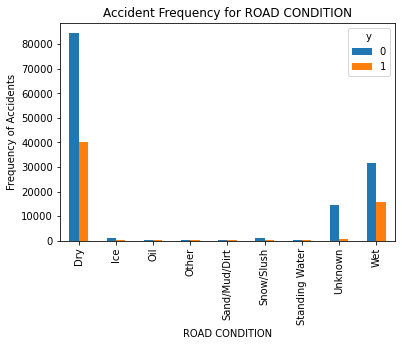

In [13]:
pd.crosstab(data.ROADCOND,data.y).plot(kind='bar')
plt.title('Accident Frequency for ROAD CONDITION')
plt.xlabel('ROAD CONDITION')
plt.ylabel('Frequency of Accidents')

The variable SPEEDING has missing values that are replaced with N (No)

In [14]:
data['SPEEDING'] = data['SPEEDING'].fillna('N')

In [15]:
data.SPEEDING.value_counts()

N    185340
Y      9333
Name: SPEEDING, dtype: int64

In [16]:
pd.crosstab(data.SPEEDING,data.y)

y,0,1
SPEEDING,,
N,130683,54657
Y,5802,3531


Text(0, 0.5, 'Frequency of Accidents')

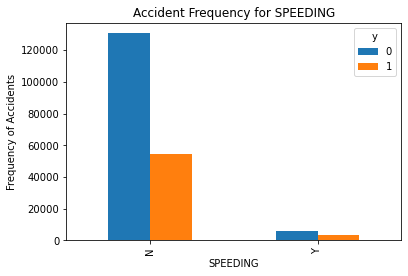

In [17]:
pd.crosstab(data.SPEEDING,data.y).plot(kind='bar')
plt.title('Accident Frequency for SPEEDING')
plt.xlabel('SPEEDING')
plt.ylabel('Frequency of Accidents')

A frequency distribution of UNDERINFL shows inconceivable mixed-up values. For consistency, we replace 0 by N (No) and 1 by Y (Yes) 

In [18]:
data.UNDERINFL.value_counts()

N    100274
0     80394
Y      5126
1      3995
Name: UNDERINFL, dtype: int64

In [19]:
data['UNDERINFL'] = data['UNDERINFL'].replace({'0': 'N', '1': 'Y'})
data.UNDERINFL.value_counts()

N    180668
Y      9121
Name: UNDERINFL, dtype: int64

In [20]:
pd.crosstab(data.UNDERINFL,data.y)

y,0,1
UNDERINFL,,
N,127071,53597
Y,5559,3562


Text(0, 0.5, 'Frequency of Accidents')

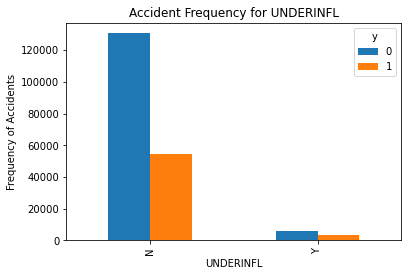

In [21]:
pd.crosstab(data.SPEEDING,data.y).plot(kind='bar')
plt.title('Accident Frequency for UNDERINFL')
plt.xlabel('UNDERINFL')
plt.ylabel('Frequency of Accidents')

A last look at the variables shows the categorical variables (Dtype "object") that will be converted to dummy variables 0 and 1 values in order to run a logistic regression

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   y               194673 non-null  int64 
 1   COLLISIONTYPE   189769 non-null  object
 2   PERSONCOUNT     194673 non-null  int64 
 3   PEDCOUNT        194673 non-null  int64 
 4   PEDCYLCOUNT     194673 non-null  int64 
 5   VEHCOUNT        194673 non-null  int64 
 6   JUNCTIONTYPE    188344 non-null  object
 7   INATTENTIONIND  29805 non-null   object
 8   UNDERINFL       189789 non-null  object
 9   WEATHER         189592 non-null  object
 10  ROADCOND        189661 non-null  object
 11  LIGHTCOND       189503 non-null  object
 12  PEDROWNOTGRNT   4667 non-null    object
 13  SPEEDING        194673 non-null  object
dtypes: int64(5), object(9)
memory usage: 20.8+ MB


In [23]:
cat_vars=['COLLISIONTYPE','JUNCTIONTYPE','INATTENTIONIND','UNDERINFL','WEATHER','ROADCOND','LIGHTCOND', 
          'PEDROWNOTGRNT', 'SPEEDING']
for var in cat_vars:
    cat_list='var'+'_'+var
    cat_list = pd.get_dummies(data[var], prefix=var)
    data1 = pd.concat([data, cat_list], axis = 1)
    data=data1
data_vars=data.columns.values.tolist()
to_keep=[i for i in data_vars if i not in cat_vars]

In [24]:
data_final=data[to_keep]
data_final.columns.values

array(['y', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT',
       'COLLISIONTYPE_Angles', 'COLLISIONTYPE_Cycles',
       'COLLISIONTYPE_Head On', 'COLLISIONTYPE_Left Turn',
       'COLLISIONTYPE_Other', 'COLLISIONTYPE_Parked Car',
       'COLLISIONTYPE_Pedestrian', 'COLLISIONTYPE_Rear Ended',
       'COLLISIONTYPE_Right Turn', 'COLLISIONTYPE_Sideswipe',
       'JUNCTIONTYPE_At Intersection (but not related to intersection)',
       'JUNCTIONTYPE_At Intersection (intersection related)',
       'JUNCTIONTYPE_Driveway Junction',
       'JUNCTIONTYPE_Mid-Block (but intersection related)',
       'JUNCTIONTYPE_Mid-Block (not related to intersection)',
       'JUNCTIONTYPE_Ramp Junction', 'JUNCTIONTYPE_Unknown',
       'INATTENTIONIND_Y', 'UNDERINFL_N', 'UNDERINFL_Y',
       'WEATHER_Blowing Sand/Dirt', 'WEATHER_Clear',
       'WEATHER_Fog/Smog/Smoke', 'WEATHER_Other', 'WEATHER_Overcast',
       'WEATHER_Partly Cloudy', 'WEATHER_Raining',
       'WEATHER_Severe Crosswind', 'WEATHER_Sl

A sensitivity analysis is performed to assess the effect of unbalanced data on the accuracy of the classification

In [25]:
# without SMOTE
from sklearn.model_selection import train_test_split
X = data_final.drop(['y'],axis=1)
y = data_final.y
# split into train test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [26]:
from sklearn.linear_model import LogisticRegression 
from sklearn import metrics
from sklearn.preprocessing import StandardScaler 
from sklearn.metrics import confusion_matrix, classification_report 

logreg = LogisticRegression(max_iter=5000)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print(classification_report(y_test, y_pred))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))


              precision    recall  f1-score   support

           0       0.76      0.95      0.84     40857
           1       0.73      0.30      0.42     17545

    accuracy                           0.76     58402
   macro avg       0.74      0.62      0.63     58402
weighted avg       0.75      0.76      0.72     58402

Accuracy of logistic regression classifier on test set: 0.76


In [27]:
# with SMOTE, only the training data is oversampled
X = data_final.loc[:, data_final.columns != 'y']
y = data_final.loc[:, data_final.columns == 'y']
#from imblearn.over_sampling import SMOTE
#from tensorflow.keras import backend
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
columns = X_train.columns
os_data_X,os_data_y=os.fit_sample(X_train, y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=['y'])
# we can Check the numbers of our data
print("length of oversampled data is ",len(os_data_X))
print("Number of property damage in oversampled data",len(os_data_y[os_data_y['y']==1]))
print("Number of injuries",len(os_data_y[os_data_y['y']==2]))
print("Proportion of property damage data in oversampled data is ",len(os_data_y[os_data_y['y']==1])/len(os_data_X))
print("Proportion of injuries data in oversampled data is ",len(os_data_y[os_data_y['y']==2])/len(os_data_X))

length of oversampled data is  191256
Number of property damage in oversampled data 95628
Number of injuries 0
Proportion of property damage data in oversampled data is  0.5
Proportion of injuries data in oversampled data is  0.0


After oversampling the training data, we now have balanced data

In [28]:
os_data_y.y.value_counts()

1    95628
0    95628
Name: y, dtype: int64

First a logit model is built by first using a recursive feature elimination (RFE) to decrease the number of features. Then a logistic regression is fit to the selected smaller set of features (the ones ranked as 1).

In [29]:
data_final_vars=data_final.columns.values.tolist()
y=['y']
X=[i for i in data_final_vars if i not in y]
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=5000)
rfe = RFE(logreg)
rfe = rfe.fit(os_data_X, os_data_y.values.ravel())
print(rfe.support_)
print(rfe.ranking_)

[False  True  True False False False False False False  True False False
  True  True False False False False False False False False  True  True
  True False  True  True False False False  True  True  True  True False
 False False False False  True  True  True False  True  True  True  True
  True  True  True  True  True False  True  True]
[20  1  1  5 11 17 10 12  9  1 23 13  1  1 15 25 16 18 24  8  6 29  1  1
  1  4  1  1  2 22  3  1  1  1  1 26  7 27 21 14  1  1  1 28  1  1  1  1
  1  1  1  1  1 19  1  1]


In [53]:
# 28 selected
cols=['PEDCOUNT','PEDCYLCOUNT','VEHCOUNT','COLLISIONTYPE_Parked Car','COLLISIONTYPE_Right Turn',
     'COLLISIONTYPE_Sideswipe','UNDERINFL_N','UNDERINFL_Y','WEATHER_Blowing Sand/Dirt','WEATHER_Fog/Smog/Smoke',
      'WEATHER_Other','WEATHER_Severe Crosswind','WEATHER_Sleet/Hail/Freezing Rain','WEATHER_Snowing','WEATHER_Unknown',
      'ROADCOND_Snow/Slush','ROADCOND_Standing Water',
     'ROADCOND_Unknown','LIGHTCOND_Dark - No Street Lights','LIGHTCOND_Dark - Street Lights Off','LIGHTCOND_Dark - Street Lights On',
      'LIGHTCOND_Dark - Unknown Lighting','LIGHTCOND_Dawn','LIGHTCOND_Daylight','LIGHTCOND_Dusk',
      'LIGHTCOND_Unknown','SPEEDING_N','SPEEDING_Y'] 
X=os_data_X[cols]
y=os_data_y['y']

In [31]:
import statsmodels.api as sm
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.542034
         Iterations 7
                                   Results: Logit
Model:                    Logit                  Pseudo R-squared:       0.218      
Dependent Variable:       y                      AIC:                    207390.4697
Date:                     2020-10-04 09:28       BIC:                    207674.9880
No. Observations:         191256                 Log-Likelihood:         -1.0367e+05
Df Model:                 27                     LL-Null:                -1.3257e+05
Df Residuals:             191228                 LLR p-value:            0.0000     
Converged:                1.0000                 Scale:                  1.0000     
No. Iterations:           7.0000                                                    
------------------------------------------------------------------------------------
                                    Coef.  Std.Err.     z     P>|z|   [0.025  0.975

In [62]:
# Two more predictors are not significant and are removed from the list: WEATHER_Blowing Sand/Dirt, WEATHER_Severe Crosswind
cols=['PEDCOUNT','PEDCYLCOUNT','VEHCOUNT','COLLISIONTYPE_Parked Car','COLLISIONTYPE_Right Turn',
     'COLLISIONTYPE_Sideswipe','UNDERINFL_N','UNDERINFL_Y','WEATHER_Fog/Smog/Smoke',
      'WEATHER_Other','WEATHER_Sleet/Hail/Freezing Rain','WEATHER_Snowing','WEATHER_Unknown',
      'ROADCOND_Snow/Slush','ROADCOND_Standing Water',
     'ROADCOND_Unknown','LIGHTCOND_Dark - No Street Lights','LIGHTCOND_Dark - Street Lights Off','LIGHTCOND_Dark - Street Lights On',
      'LIGHTCOND_Dark - Unknown Lighting','LIGHTCOND_Dawn','LIGHTCOND_Daylight','LIGHTCOND_Dusk',
      'LIGHTCOND_Unknown','SPEEDING_N','SPEEDING_Y'] 
X=os_data_X[cols]
y=os_data_y['y']
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.542046
         Iterations 7
                                   Results: Logit
Model:                    Logit                  Pseudo R-squared:       0.218      
Dependent Variable:       y                      AIC:                    207391.0307
Date:                     2020-10-04 11:38       BIC:                    207655.2263
No. Observations:         191256                 Log-Likelihood:         -1.0367e+05
Df Model:                 25                     LL-Null:                -1.3257e+05
Df Residuals:             191230                 LLR p-value:            0.0000     
Converged:                1.0000                 Scale:                  1.0000     
No. Iterations:           7.0000                                                    
------------------------------------------------------------------------------------
                                    Coef.  Std.Err.     z     P>|z|   [0.025  0.975

In summary pedestrian, bicycle, vehicle counts, whether under influence or not, collision type, weather, road condition, light condition, and speeding are statistically significant predictors of accident severity at 0.05 significance level.

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression(max_iter=5000)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print(classification_report(y_test, y_pred))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

              precision    recall  f1-score   support

           0       0.77      0.57      0.66     28669
           1       0.66      0.83      0.74     28708

    accuracy                           0.70     57377
   macro avg       0.72      0.70      0.70     57377
weighted avg       0.72      0.70      0.70     57377

Accuracy of logistic regression classifier on test set: 0.70


In [64]:
# confusion matrix
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[16412 12257]
 [ 4856 23852]]


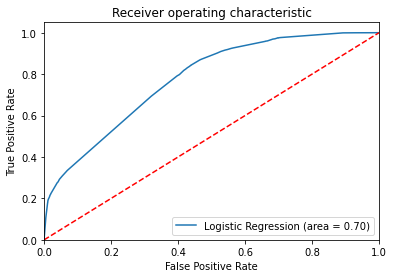

In [65]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Assuming the relationship is non-linear, a single decision tree model and an ensemble decision tree model (random forest) are built

In [39]:
# The decision tree classifier.
seed_value = 12321
from sklearn import tree #For our Decision Tree
import pandas as pd # For our DataFrame
import pydotplus # To create our Decision Tree Graph
from IPython.display import Image  # To Display a image of our graph
from sklearn.model_selection import train_test_split
X=os_data_X[cols]
y=os_data_y['y']
# split into train test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
clf = tree.DecisionTreeClassifier()
# Training the Decision Tree
clf_train = clf.fit(X_train, y_train)
# Export/Print a decision tree in DOT format.
#print(tree.export_graphviz(clf_train, None))
#Create Dot Data
dot_data = tree.export_graphviz(clf_train, out_file=None, feature_names=list(X_train.columns.values), 
                                class_names=['Property', 'Injuries'], rounded=True, filled=True) #Gini decides which attribute/feature should be placed at the root node, which features will act as internal nodes or leaf nodes
#Create Graph from DOT data
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.541738 to fit



In [40]:
# prediction on test set
y_pred=clf.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.701901458772679


In [41]:
from sklearn.metrics import confusion_matrix, classification_report 
print(classification_report(y_test, y_pred))
print('Accuracy of decision tree classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

              precision    recall  f1-score   support

           0       0.77      0.57      0.66     28669
           1       0.66      0.83      0.74     28708

    accuracy                           0.70     57377
   macro avg       0.72      0.70      0.70     57377
weighted avg       0.72      0.70      0.70     57377

Accuracy of decision tree classifier on test set: 0.70


In [42]:
y_pred = clf.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[16342, 12327],
       [ 4777, 23931]])

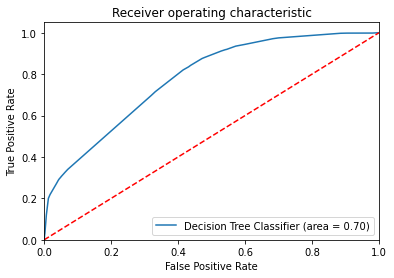

In [66]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, clf.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test,clf.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Decision Tree Classifier (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In terms of classifier accuracy, logistic regression and a single decision tree are not very different. 

In [67]:
# split into train test sets
X=os_data_X[cols]
y=os_data_y['y']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
# define the model
model = RandomForestClassifier(n_estimators=1000)
# fit the model
model.fit(X_train, y_train.values.ravel())
ypred = model.predict(X_test)


Based on variable importance below, Feature 0,1,2,3 and 5 are important (with score of 0.09 or above) in classifying accident severity: they are PEDCOUNT, PEDCYLCOUNT, VEHCOUNT, COLLISIONTYPE_Parked Car, and COLLISIONTYPE_Sideswipe

Feature: 0, Score: 0.12757
Feature: 1, Score: 0.08628
Feature: 2, Score: 0.09624
Feature: 3, Score: 0.39160
Feature: 4, Score: 0.00931
Feature: 5, Score: 0.10072
Feature: 6, Score: 0.01318
Feature: 7, Score: 0.00804
Feature: 8, Score: 0.00035
Feature: 9, Score: 0.00168
Feature: 10, Score: 0.00155
Feature: 11, Score: 0.00027
Feature: 12, Score: 0.00091
Feature: 13, Score: 0.00278
Feature: 14, Score: 0.03596
Feature: 15, Score: 0.00312
Feature: 16, Score: 0.00092
Feature: 17, Score: 0.04353
Feature: 18, Score: 0.00343
Feature: 19, Score: 0.00271
Feature: 20, Score: 0.00712
Feature: 21, Score: 0.00009
Feature: 22, Score: 0.00376
Feature: 23, Score: 0.01154
Feature: 24, Score: 0.00461
Feature: 25, Score: 0.02956
Feature: 26, Score: 0.00733
Feature: 27, Score: 0.00584


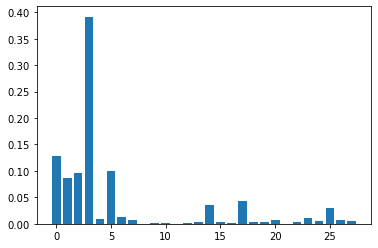

In [56]:
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
      print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [58]:
from sklearn.metrics import confusion_matrix, classification_report 
print(classification_report(y_test, y_pred))
print('Accuracy of random forest classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

              precision    recall  f1-score   support

           0       0.77      0.57      0.66     28669
           1       0.66      0.83      0.74     28708

    accuracy                           0.70     57377
   macro avg       0.72      0.70      0.70     57377
weighted avg       0.72      0.70      0.70     57377

Accuracy of random forest classifier on test set: 0.70


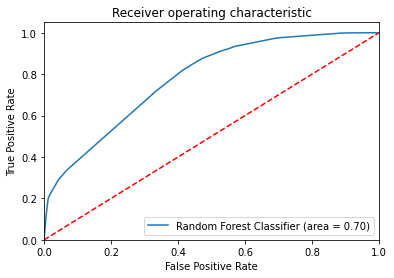

In [68]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test,model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest Classifier (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

# Results and Discussion

* The results suggest that the following 5 variables are important candidate variables to classify accident severity outcome (property damage and injuries): the number of pedestrians involved in the collision, the number of bicycles involved in the collision, the number of vehicles involved in the collision, the collision type (Parked Car, or Sideswipe). 
<br>
* The data present an imbalance in the target variable: 30% of injuries and 70% of property damage. The analysis shows that oversampling the minority category to balance accident severity did not improve the performance of a logistic regression. Dummy encoding to convert nine categorical variables to numerical, made the features very sparse. In terms of performance balancing the data and encoding all categorical variables did not make any difference in accuracy performance accuracy among the three machine learning algorithms: logistic regression, a single decision tree classification and an ensemble learning (random forest). 
<br>
* For all three algorithms, we have pretty good prediction (F1-score of 0.70) and recall (recall of 0.70).
<br>
* It was surprising that some features such as road condition, light condition, weather, that would make sense to classify accident severity did not make the cut with respect to variable importance. Excluding them as classifiers did not decrease the average accuracy. 



# Conclusion

The purpose of the project is to determine the classifiers of accident severity. The SMOTE algorithm was use to balance the class in order to remove bias from the analysis results and to get accurate classification. The list of classifiers was pruned out using recursive feature elimination. The model trained with logit regression, the reduced list of classifiers was statistically significant. However, using this small list in a machine learning context did not improve the accuracy of three classifiers: a logistic regression, a single decision tree, and an ensemble decision tree model. This is due mainly to the sparsity of the categorical features after they were encoded.  